## Lesson 7 - PTT Crawler




### Table of Contents

* [Web Crawler - PTT](#ptt-crawler)
* [Hack PTT age check as an adult](#cookie)
* [Crawl PTT post by link](#Crawl-ptt-post-by-link)
* [Crawl ptt board by name](#Crawl-ptt-board-by-name)
* [Check your DataFrame data set](#Check-DataFrame-data)
* [Data Visualization](#Short-Visualization)
* [PTT Gossiping Word cloud](#word-cloud)
* [Read PTT Sentimental data set](#ptt-sentimental-data-set)

<a id="ptt-crawler"></a>
### Import Package

In [1]:
#coding=utf-8 
import re, json, requests, time, datetime
import pandas as pd
import numpy as np
import io, json
from bs4 import BeautifulSoup

import sys
import os
from os import path
import jieba
import jieba.analyse as analyse
from collections import Counter
from wordcloud import WordCloud
from matplotlib import pyplot as plt
%matplotlib inline
from PIL import Image

requests.packages.urllib3.disable_warnings()

### Crawl single post from ptt.cc by using requests package

In [2]:
import requests

r = requests.get('https://www.ptt.cc/bbs/PlayStation/M.1573432057.A.3EA.html')
print (r.text[:200])

<!DOCTYPE html>
<html>
	<head>
		<meta charset="utf-8">
		

<meta name="viewport" content="width=device-width, initial-scale=1">

<title>[情報] 「死亡擱淺」首週銷量是「往日不再」64% - 看板 PlayStation - 批踢踢實業坊</title>
<me


In [3]:
import requests

r = requests.get('https://github.com/timeline.json')

jString = r.json()
print (jString)

{'message': 'Hello there, wayfaring stranger. If you’re reading this then you probably didn’t see our blog post a couple of years back announcing that this API would go away: http://git.io/17AROg Fear not, you should be able to get what you need from the shiny new Events API instead.', 'documentation_url': 'https://docs.github.com/v3/activity/events/#list-public-events'}


In [4]:
### 解析 JSON
for x in jString:
    print("key: {}".format(x))
    print(jString[x])
    print("="*5)

key: message
Hello there, wayfaring stranger. If you’re reading this then you probably didn’t see our blog post a couple of years back announcing that this API would go away: http://git.io/17AROg Fear not, you should be able to get what you need from the shiny new Events API instead.
=====
key: documentation_url
https://docs.github.com/v3/activity/events/#list-public-events
=====


In [5]:
## Store cookie sessioin with connection
rs = requests.session()
r = rs.get('https://www.ptt.cc/bbs/PlayStation/M.1573432057.A.3EA.html')
html_data = r.text
html_data

'<!DOCTYPE html>\n<html>\n\t<head>\n\t\t<meta charset="utf-8">\n\t\t\n\n<meta name="viewport" content="width=device-width, initial-scale=1">\n\n<title>[情報] 「死亡擱淺」首週銷量是「往日不再」64% - 看板 PlayStation - 批踢踢實業坊</title>\n<meta name="robots" content="all">\n<meta name="keywords" content="Ptt BBS 批踢踢">\n<meta name="description" content="https://www.gamesindustry.biz/articles/2019-11-10-uk-\ncharts-death-stranding-is-the-second-biggest-ps4-launch-of-2019\nUK 首週銷售量：&#34;死亡擱淺&#34;比&#34;往日不再&#34;的首週少 36%。\n（即只有 64%）。\n更新：首週 UK 紀錄，參考資料\n">\n<meta property="og:site_name" content="Ptt 批踢踢實業坊">\n<meta property="og:title" content="[情報] 「死亡擱淺」首週銷量是「往日不再」64%">\n<meta property="og:description" content="https://www.gamesindustry.biz/articles/2019-11-10-uk-\ncharts-death-stranding-is-the-second-biggest-ps4-launch-of-2019\nUK 首週銷售量：&#34;死亡擱淺&#34;比&#34;往日不再&#34;的首週少 36%。\n（即只有 64%）。\n更新：首週 UK 紀錄，參考資料\n">\n<link rel="canonical" href="https://www.ptt.cc/bbs/PlayStation/M.1573432057.A.3EA.html">\n\n<link rel="style

<a id="cookie"></a>
### 我未滿18歲?

In [6]:
rs = requests.session()

r = rs.get('https://www.ptt.cc/bbs/Gossiping/M.1573410895.A.DCE.html')
html_data = r.text
html_data

'<!DOCTYPE html>\n<html>\n\t<head>\n\t\t<meta charset="utf-8">\n\t\t\n\n<meta name="viewport" content="width=device-width, initial-scale=1">\n\n<title>批踢踢實業坊</title>\n\n<link rel="stylesheet" type="text/css" href="//images.ptt.cc/bbs/v2.27/bbs-common.css">\n<link rel="stylesheet" type="text/css" href="//images.ptt.cc/bbs/v2.27/bbs-base.css" media="screen">\n<link rel="stylesheet" type="text/css" href="//images.ptt.cc/bbs/v2.27/bbs-custom.css">\n<link rel="stylesheet" type="text/css" href="//images.ptt.cc/bbs/v2.27/pushstream.css" media="screen">\n<link rel="stylesheet" type="text/css" href="//images.ptt.cc/bbs/v2.27/bbs-print.css" media="print">\n\n\n\n\n\t</head>\n    <body>\n\t\t\n<div class="bbs-screen bbs-content">\n    <div class="over18-notice">\n        <p>本網站已依網站內容分級規定處理</p>\n\n        <p>警告︰您即將進入之看板內容需滿十八歲方可瀏覽。</p>\n\n        <p>若您尚未年滿十八歲，請點選離開。若您已滿十八歲，亦不可將本區之內容派發、傳閱、出售、出租、交給或借予年齡未滿18歲的人士瀏覽，或將本網站內容向該人士出示、播放或放映。</p>\n    </div>\n</div>\n\n<div class="bbs-screen bbs-content cent

### 用一行程式讓自己成年

In [7]:
import requests

rs = requests.session()

cookie = {'over18': '1'}
r = rs.get('https://www.ptt.cc/bbs/Gossiping/M.1573410895.A.DCE.html', cookies=cookie)
html_data = r.text
html_data

'<!DOCTYPE html>\n<html>\n\t<head>\n\t\t<meta charset="utf-8">\n\t\t\n\n<meta name="viewport" content="width=device-width, initial-scale=1">\n\n<title>404</title>\n\n<link rel="stylesheet" type="text/css" href="//images.ptt.cc/bbs/v2.27/bbs-common.css">\n<link rel="stylesheet" type="text/css" href="//images.ptt.cc/bbs/v2.27/bbs-base.css" media="screen">\n<link rel="stylesheet" type="text/css" href="//images.ptt.cc/bbs/v2.27/bbs-custom.css">\n<link rel="stylesheet" type="text/css" href="//images.ptt.cc/bbs/v2.27/pushstream.css" media="screen">\n<link rel="stylesheet" type="text/css" href="//images.ptt.cc/bbs/v2.27/bbs-print.css" media="print">\n\n\n\n\n\t</head>\n    <body>\n\t\t\n<div class="main-container">\n\t<div class="bbs-screen bbs-content">404 - Not Found.</div>\n</div>\n\n\t\t\n\n<script>\n  (function(i,s,o,g,r,a,m){i[\'GoogleAnalyticsObject\']=r;i[r]=i[r]||function(){\n  (i[r].q=i[r].q||[]).push(arguments)},i[r].l=1*new Date();a=s.createElement(o),\n  m=s.getElementsByTagName(

<a id="Crawl-ptt-post-by-link"></a>
### pick up a ptt Gossiping post link from browser

In [8]:
url = "https://www.ptt.cc/bbs/Gossiping/M.1614232552.A.C11.html"

In [9]:
def over18(PttName):
    # over 18
    load={
        'from':'/bbs/'+PttName+'/index.html',
        'yes':'yes' 
    }
    res = rs.post('https://www.ptt.cc/ask/over18', verify=False, data=load)
over18(url.replace("https://www.ptt.cc/bbs/", "").split("/")[0])

In [10]:
# 此時的 rs 物件已經滿18歲了
web = rs.get(url, timeout=60)
soup = BeautifulSoup(web.text, 'html.parser')

In [11]:
soup

<!DOCTYPE html>

<html>
<head>
<meta charset="utf-8"/>
<meta content="width=device-width, initial-scale=1" name="viewport"/>
<title>[問卦] M$到底是什麼心態搞出Powershell - 看板 Gossiping - 批踢踢實業坊</title>
<meta content="all" name="robots"/>
<meta content="Ptt BBS 批踢踢" name="keywords"/>
<meta content="前兩天我才問說
M$ 把 Powershell 弄出來、卻又不讓他可以直接用
現在我後悔了
我要問說
這到底什麼拉基語言
" name="description"/>
<meta content="Ptt 批踢踢實業坊" property="og:site_name"/>
<meta content="[問卦] M$到底是什麼心態搞出Powershell" property="og:title"/>
<meta content="前兩天我才問說
M$ 把 Powershell 弄出來、卻又不讓他可以直接用
現在我後悔了
我要問說
這到底什麼拉基語言
" property="og:description"/>
<link href="https://www.ptt.cc/bbs/Gossiping/M.1614232552.A.C11.html" rel="canonical"/>
<link href="//images.ptt.cc/bbs/v2.27/bbs-common.css" rel="stylesheet" type="text/css"/>
<link href="//images.ptt.cc/bbs/v2.27/bbs-base.css" media="screen" rel="stylesheet" type="text/css"/>
<link href="//images.ptt.cc/bbs/v2.27/bbs-custom.css" rel="stylesheet" type="text/css"/>
<link href="//images.ptt.cc/bbs/v2.2

In [12]:
# author
author = soup.select('.article-meta-value')[0].text
#author = soup.find("span", {'class': 'article-meta-value'}).text
print("AUTHOR: \n", author)

AUTHOR: 
 wahaha99 (此方不可長)


In [13]:
# title
title = soup.select('.article-meta-value')[2].text
print("TITLE: \n", title)

TITLE: 
 [問卦] M$到底是什麼心態搞出Powershell


In [14]:
# date
date = soup.select('.article-meta-value')[3].text
print("DATE: \n", date)

DATE: 
 Thu Feb 25 13:55:50 2021


In [15]:
# ip       
try:
    targetIP=u'※ 發信站: 批踢踢實業坊'
    ip =  soup.find(string = re.compile(targetIP))
    ip = re.search(r"[0-9]*\.[0-9]*\.[0-9]*\.[0-9]*",ip).group()
except:
    ip = "ip is not find"
print("IP: \n", ip)

IP: 
 118.169.43.85


In [16]:
# content
content = soup.find(id="main-content").text
target_content=u'※ 發信站: 批踢踢實業坊(ptt.cc),'
content = content.split(target_content)
content = content[0].split(date)
main_content = content[1].replace('\n', '  ').replace('\t', '  ')
print("CONTENT: \n", main_content)

CONTENT: 
     前兩天我才問說  M$ 把 Powershell 弄出來、卻又不讓他可以直接用    現在我後悔了  我要問說  這到底什麼拉基語言  所有的語法都亂七八糟的    Write-host "這什麼屎?$shit"    Write-host "這什麼屎?"$shit    這兩個竟然都能過  但下面的?後會多一個空格  這種變數跟常數混寫的天才設計  完全不知道在搞什麼屎    還有就是    Function thisShit {  return "shit"  }    如果是 $what = thisShit 就很正常  但如果直接一行 thisShit  竟然會莫名其妙在 console 打印出 shit  為這問題抓了半小時    你他媽....我又沒下Write-host    這麼隨便的設計  卻又沒有強大的IDE輔助  最後就是不知道自己在寫什麼屎      有沒有設計Powershell的人腦袋很有事的八卦?  如果想要易用就給他好的IDE  不然就要語法嚴謹啊    --  


In [17]:
# message
num, push, dislike, neutral, message = 0,0,0,0,{}
for tag in soup.select('div.push'):
    num += 1
    push_tag = tag.find("span", {'class': 'push-tag'}).text
    push_userid = tag.find("span", {'class': 'push-userid'}).text       
    push_content = str(tag.find("span", {'class': 'push-content'}).text)[1:]
    push_ipdatetime = tag.find("span", {'class': 'push-ipdatetime'}).text
    push_ipdatetime = push_ipdatetime.replace("\n","")
    message[num]={"tag":push_tag,"user":push_userid,"content":push_content,"time":push_ipdatetime}
    if '推' in str(push_tag):
        push += 1
    elif '→' in str(push_tag):
        neutral += 1
    else:
        dislike += 1

In [18]:
print("TOTAL_COMMENT_COUNT: \n", num)

TOTAL_COMMENT_COUNT: 
 40


In [19]:
print("PUSH_COUNT: \n", push)

PUSH_COUNT: 
 22


In [20]:
print("NEUTRAL_COUNT: \n", neutral)

NEUTRAL_COUNT: 
 14


In [21]:
print("DISLIKE_COUNT: \n", dislike)

DISLIKE_COUNT: 
 4


In [22]:
print("COMMENTS:")
for k in message:
    print(message[k], "\n", "="*80)

COMMENTS:
{'tag': '→ ', 'user': 'showdoggy', 'content': ' 不夠嚴謹', 'time': ' 02/25 13:56'} 
{'tag': '推 ', 'user': 'cattgirl', 'content': ' 摸不到 c 罩杯', 'time': ' 02/25 13:57'} 
{'tag': '→ ', 'user': 'james732', 'content': ' 不然你要用cmd.exe嗎', 'time': ' 02/25 13:57'} 
{'tag': '推 ', 'user': 'cuteSquirrel', 'content': ' XDDDDDD 可能想學bash吧', 'time': ' 02/25 13:57'} 
{'tag': '→ ', 'user': 'peter0825', 'content': ' Write-Host, Write-Output, 直接打變數, Echo, Write', 'time': ' 02/25 13:58'} 
{'tag': '→ ', 'user': 'peter0825', 'content': ' , 直接打字串  都會是一樣的結果', 'time': ' 02/25 13:58'} 
{'tag': '→ ', 'user': 'peter0825', 'content': ' (stdout)', 'time': ' 02/25 13:59'} 
{'tag': '推 ', 'user': 'h0103661', 'content': ' 第二個情況python之類的也會啊', 'time': ' 02/25 13:59'} 
{'tag': '→ ', 'user': 'h0103661', 'content': ' 不如說你沒有用到還呼叫是叫心酸的嗎...', 'time': ' 02/25 14:00'} 
{'tag': '→ ', 'user': 'lturtsamuel', 'content': ' 好險我都用cygwin', 'time': ' 02/25 14:00'} 
{'tag': '推 ', 'user': 't81511270', 'content': ' 我也不知道 為什麼有cmd 也有 power

In [23]:
page_data = {"url":url,
              "author":author,
              "title":title,
              "time":date,
              "ip":ip,
              "content":main_content,
              "comments":message,
              "push":push,
              "dislike":dislike,
              "neutral":neutral,
              "all":num}

In [24]:
page_list = [["url","time","title","author","ip","content","all_comment_count","push_count","neutral_count","dislike_count","comment_status","comment_time","comment_user","comment_content"]]
for k in page_data["comments"]:
    page_list.append([page_data["url"],page_data["time"],page_data["title"],page_data["author"],page_data["ip"],page_data["content"],page_data["all"],page_data["push"],page_data["neutral"],page_data["dislike"],page_data["comments"][k]["tag"],page_data["comments"][k]["time"],page_data["comments"][k]["user"],page_data["comments"][k]["content"]])
page_df = pd.DataFrame(page_list[1:], columns=page_list[0])
page_df.head(1)

,url,time,title,author,ip,content,all_comment_count,push_count,neutral_count,dislike_count,comment_status,comment_time,comment_user,comment_content
0,https://www.ptt.cc/bbs/Gossiping/M.1614232552....,Thu Feb 25 13:55:50 2021,[問卦] M$到底是什麼心態搞出Powershell,wahaha99 (此方不可長),118.169.43.85,前兩天我才問說 M$ 把 Powershell 弄出來、卻又不讓他可以直接用 ...,40,22,14,4,→,02/25 13:56,showdoggy,不夠嚴謹


<a id="Crawl-ptt-board-by-name"></a>
### Crawl ptt board by name

In [25]:
rs=requests.session()
requests.packages.urllib3.disable_warnings()

def over18(PttName):
    # over 18
    load={
        'from':'/bbs/'+PttName+'/index.html',
        'yes':'yes' 
    }
    res=rs.post('https://www.ptt.cc/ask/over18',verify=False,data=load)

def PageCount(PttName):
    # get index page number
    res=rs.get('https://www.ptt.cc/bbs/'+PttName+'/index.html',verify=False, timeout=60)
    soup=BeautifulSoup(res.text,'html.parser')
    ALLpageURL = soup.select('.btn.wide')[1]['href']
    ALLpage=int(getPageNumber(ALLpageURL))+1
    return  ALLpage
    
def getPageNumber(content):
    # get article url id number
    startIndex = content.find('index')
    endIndex = content.find('.html')
    pageNumber = content[startIndex+5 : endIndex]
    return pageNumber

def parse_article(link , g_id):
    print("parsing: %s" % link)
    res=rs.get(link,verify=False, timeout=60)
    soup = BeautifulSoup(res.text,'html.parser')
    # author
    author  = soup.select('.article-meta-value')[0].text
    #author = soup.find("span", {'class': 'article-meta-value'}).text              
    # title
    title = soup.select('.article-meta-value')[2].text
    # date
    date = soup.select('.article-meta-value')[3].text
    # ip       
    try:
        targetIP=u'※ 發信站: 批踢踢實業坊'
        ip =  soup.find(string = re.compile(targetIP))
        ip = re.search(r"[0-9]*\.[0-9]*\.[0-9]*\.[0-9]*",ip).group()
    except:
        ip = "ip is not find"

    # content
    content = soup.find(id="main-content").text
    target_content=u'※ 發信站: 批踢踢實業坊(ptt.cc),'
    content = content.split(target_content)
    content = content[0].split(date)
    main_content = content[1].replace('\n', '  ').replace('\t', '  ')

    # message
    num, push, dislike, neutral, message = 0,0,0,0,{}
    for tag in soup.select('div.push'):
        num += 1
        push_tag = tag.find("span", {'class': 'push-tag'}).text
        push_userid = tag.find("span", {'class': 'push-userid'}).text       
        push_content = str(tag.find("span", {'class': 'push-content'}).text)[1:]
        push_ipdatetime = tag.find("span", {'class': 'push-ipdatetime'}).text
        push_ipdatetime = push_ipdatetime.replace("\n","")
        message[num]={"tag":push_tag,"user":push_userid,"content":push_content,"time":push_ipdatetime}
        if '推' in str(push_tag):
            push += 1
        elif '→' in str(push_tag):
            neutral += 1
        else:
            dislike += 1    
    dic={"url":link,"author":author,"title":title,"time":date,"ip":ip,"content":main_content,"comments":message,"push":push,"dislike":dislike,"neutral":neutral,"all":num}
    #json_data = json.dumps(dic, ensure_ascii=False,indent=4,sort_keys=True)
    return dic

def crawler(PttName, ParsingPage):
    print ('Start parsing [',PttName,']....')
    ALLpage=PageCount(PttName)
    g_id = 0
    result_list = []
    for number in range(ALLpage, ALLpage-int(ParsingPage),-1):
        url = 'https://www.ptt.cc/bbs/'+PttName+'/index'+str(number)+'.html'
        print(url)
        res = rs.get(url,verify=False, timeout=60)
        soup = BeautifulSoup(res.text,'html.parser')
        for tag in soup.select('div.title'):
            try:
                atag=tag.find('a')
                time.sleep(2)
                if(atag):
                    URL=atag['href']
                    link='https://www.ptt.cc'+URL
                g_id = g_id+1
                tmp_dic = parse_article(link, g_id)
                result_list.append(tmp_dic)
            except Exception as e:
                print(str(e))
    return result_list

In [26]:
# setting
PttName="Gossiping"
ParsingPage = 1

In [27]:
# crawler
over18(PttName)
board_data = crawler(PttName,ParsingPage)

Start parsing [ Gossiping ]....
https://www.ptt.cc/bbs/Gossiping/index39384.html
parsing: https://www.ptt.cc/bbs/Gossiping/M.1634886576.A.6ED.html
parsing: https://www.ptt.cc/bbs/Gossiping/M.1634886597.A.91D.html
parsing: https://www.ptt.cc/bbs/Gossiping/M.1634886603.A.D5F.html
parsing: https://www.ptt.cc/bbs/Gossiping/M.1634886608.A.02C.html
parsing: https://www.ptt.cc/bbs/Gossiping/M.1634886615.A.C14.html
parsing: https://www.ptt.cc/bbs/Gossiping/M.1634886627.A.E9A.html
parsing: https://www.ptt.cc/bbs/Gossiping/M.1634886669.A.B41.html
parsing: https://www.ptt.cc/bbs/Gossiping/M.1634886716.A.FC4.html
parsing: https://www.ptt.cc/bbs/Gossiping/M.1634886822.A.19A.html
parsing: https://www.ptt.cc/bbs/Gossiping/M.1634365321.A.D66.html
parsing: https://www.ptt.cc/bbs/Gossiping/M.1634468546.A.AFC.html
parsing: https://www.ptt.cc/bbs/Gossiping/M.1620716589.A.F0C.html
parsing: https://www.ptt.cc/bbs/Gossiping/M.1634794951.A.710.html
https://www.ptt.cc/bbs/Gossiping/index39383.html
parsing: htt

parsing: https://www.ptt.cc/bbs/Gossiping/M.1634883218.A.AB0.html
parsing: https://www.ptt.cc/bbs/Gossiping/M.1634883309.A.AD4.html
parsing: https://www.ptt.cc/bbs/Gossiping/M.1634883331.A.589.html
parsing: https://www.ptt.cc/bbs/Gossiping/M.1634883337.A.708.html
parsing: https://www.ptt.cc/bbs/Gossiping/M.1634883388.A.C05.html
parsing: https://www.ptt.cc/bbs/Gossiping/M.1634883432.A.B23.html
parsing: https://www.ptt.cc/bbs/Gossiping/M.1634883478.A.4E0.html
parsing: https://www.ptt.cc/bbs/Gossiping/M.1634883489.A.EA1.html
parsing: https://www.ptt.cc/bbs/Gossiping/M.1634883533.A.43B.html
parsing: https://www.ptt.cc/bbs/Gossiping/M.1634883543.A.E32.html
parsing: https://www.ptt.cc/bbs/Gossiping/M.1634883566.A.189.html
parsing: https://www.ptt.cc/bbs/Gossiping/M.1634883604.A.B46.html
parsing: https://www.ptt.cc/bbs/Gossiping/M.1634883641.A.B00.html
parsing: https://www.ptt.cc/bbs/Gossiping/M.1634883667.A.706.html
https://www.ptt.cc/bbs/Gossiping/index39377.html
parsing: https://www.ptt.cc

In [28]:
board_df = pd.DataFrame(board_data, columns=["time", "url", "author", "title", "ip", "content", "all", "push", "neutral", "dislike"])

<a id="Check-DataFrame-data"></a>
### Check your DataFrame data set

Structured Data: DataFrame

In [29]:
# 單一篇文章
page_df.head()

,url,time,title,author,ip,content,all_comment_count,push_count,neutral_count,dislike_count,comment_status,comment_time,comment_user,comment_content
0,https://www.ptt.cc/bbs/Gossiping/M.1614232552....,Thu Feb 25 13:55:50 2021,[問卦] M$到底是什麼心態搞出Powershell,wahaha99 (此方不可長),118.169.43.85,前兩天我才問說 M$ 把 Powershell 弄出來、卻又不讓他可以直接用 ...,40,22,14,4,→,02/25 13:56,showdoggy,不夠嚴謹
1,https://www.ptt.cc/bbs/Gossiping/M.1614232552....,Thu Feb 25 13:55:50 2021,[問卦] M$到底是什麼心態搞出Powershell,wahaha99 (此方不可長),118.169.43.85,前兩天我才問說 M$ 把 Powershell 弄出來、卻又不讓他可以直接用 ...,40,22,14,4,推,02/25 13:57,cattgirl,摸不到 c 罩杯
2,https://www.ptt.cc/bbs/Gossiping/M.1614232552....,Thu Feb 25 13:55:50 2021,[問卦] M$到底是什麼心態搞出Powershell,wahaha99 (此方不可長),118.169.43.85,前兩天我才問說 M$ 把 Powershell 弄出來、卻又不讓他可以直接用 ...,40,22,14,4,→,02/25 13:57,james732,不然你要用cmd.exe嗎
3,https://www.ptt.cc/bbs/Gossiping/M.1614232552....,Thu Feb 25 13:55:50 2021,[問卦] M$到底是什麼心態搞出Powershell,wahaha99 (此方不可長),118.169.43.85,前兩天我才問說 M$ 把 Powershell 弄出來、卻又不讓他可以直接用 ...,40,22,14,4,推,02/25 13:57,cuteSquirrel,XDDDDDD 可能想學bash吧
4,https://www.ptt.cc/bbs/Gossiping/M.1614232552....,Thu Feb 25 13:55:50 2021,[問卦] M$到底是什麼心態搞出Powershell,wahaha99 (此方不可長),118.169.43.85,前兩天我才問說 M$ 把 Powershell 弄出來、卻又不讓他可以直接用 ...,40,22,14,4,→,02/25 13:58,peter0825,"Write-Host, Write-Output, 直接打變數, Echo, Write"


In [30]:
# 單一專版
board_df.head()

,time,url,author,title,ip,content,all,push,neutral,dislike
0,Fri Oct 22 15:09:34 2021,https://www.ptt.cc/bbs/Gossiping/M.1634886576....,ClownT (克朗),[問卦] 前陣子因疫情關門的店家可惜了吧？,49.216.8.160,前陣子疫情剛爆發時，就是5月中到7月中的時候 因為禁止內用加上大家都不出門 記得...,0,0,0,0
1,Fri Oct 22 15:09:55 2021,https://www.ptt.cc/bbs/Gossiping/M.1634886597....,guoair (故鄉的歌),[新聞] 基隆捷運路線 林右昌：應該很快會有好消,122.117.158.136,基隆捷運路線 林右昌：應該很快會有好消息 2021/10/21 18:56 ...,0,0,0,0
2,Fri Oct 22 15:10:01 2021,https://www.ptt.cc/bbs/Gossiping/M.1634886603....,Supergreen (Hi),[新聞] 國家機器挺陳柏惟？國民黨質疑挺3Q音樂會,114.137.157.161,https://udn.com/news/story/6656/5836117?from...,0,0,0,0
3,Fri Oct 22 15:10:05 2021,https://www.ptt.cc/bbs/Gossiping/M.1634886608....,chenmysi (☠),[新聞] 馬來西亞學生集體中邪 該學校驚傳與「中,111.246.17.89,1.媒體來源: tvbs 2.記者署名: 彭玉儀 3.完整新聞標題:...,0,0,0,0
4,Fri Oct 22 15:10:12 2021,https://www.ptt.cc/bbs/Gossiping/M.1634886615....,whs1987 (大大碩),[爆卦]仇笑癡過世二十七週年,36.228.98.118,仇笑痴 殺死賭神妻子、剁掉賭魔陳金城雙手 還把小貓咪丟出窗外的辣個男人 在27年前...,0,0,0,0


Semi-structured Data: Json

In [31]:
page_data

{'url': 'https://www.ptt.cc/bbs/Gossiping/M.1614232552.A.C11.html',
 'author': 'wahaha99 (此方不可長)',
 'title': '[問卦] M$到底是什麼心態搞出Powershell',
 'time': 'Thu Feb 25 13:55:50 2021',
 'ip': '118.169.43.85',
 'content': '    前兩天我才問說  M$ 把 Powershell 弄出來、卻又不讓他可以直接用    現在我後悔了  我要問說  這到底什麼拉基語言  所有的語法都亂七八糟的    Write-host "這什麼屎?$shit"    Write-host "這什麼屎?"$shit    這兩個竟然都能過  但下面的?後會多一個空格  這種變數跟常數混寫的天才設計  完全不知道在搞什麼屎    還有就是    Function thisShit {  return "shit"  }    如果是 $what = thisShit 就很正常  但如果直接一行 thisShit  竟然會莫名其妙在 console 打印出 shit  為這問題抓了半小時    你他媽....我又沒下Write-host    這麼隨便的設計  卻又沒有強大的IDE輔助  最後就是不知道自己在寫什麼屎      有沒有設計Powershell的人腦袋很有事的八卦?  如果想要易用就給他好的IDE  不然就要語法嚴謹啊    --  ',
 'comments': {1: {'tag': '→ ',
   'user': 'showdoggy',
   'content': ' 不夠嚴謹',
   'time': ' 02/25 13:56'},
  2: {'tag': '推 ',
   'user': 'cattgirl',
   'content': ' 摸不到 c 罩杯',
   'time': ' 02/25 13:57'},
  3: {'tag': '→ ',
   'user': 'james732',
   'content': ' 不然你要用cmd.exe嗎',
   'time': ' 02/25 13:57'},
  4: {'tag': '推 ',
  

In [32]:
board_data[0]

{'url': 'https://www.ptt.cc/bbs/Gossiping/M.1634886576.A.6ED.html',
 'author': 'ClownT (克朗)',
 'title': '[問卦] 前陣子因疫情關門的店家可惜了吧？',
 'time': 'Fri Oct 22 15:09:34 2021',
 'ip': '49.216.8.160',
 'content': '    前陣子疫情剛爆發時，就是5月中到7月中的時候  因為禁止內用加上大家都不出門  記得很多商圈店家都倒光，不論做吃的還是賣其他東西  其中不乏很多數十年老店撐不下去    結果台灣疫情控制蠻快的，7月底就開放內用，各方面逐漸解封  到現在各大商圈人潮都回來了，該排隊的店繼續排隊，購物還有振興券加持  回頭看，當時說疫情看不到盡頭，只好忍痛關店的那些店家是不是有點可惜？  -----  Sent from JPTT on my iPhone    --  ',
 'comments': {},
 'push': 0,
 'dislike': 0,
 'neutral': 0,
 'all': 0}

### Write to file

In [33]:
def to_excel(df, file_name):
    # excel
    writer = pd.ExcelWriter(file_name+".xlsx")
    df.to_excel(writer,'Sheet1', index = False)
    writer.save()

def to_csv(df, file_name):
    # csv
    df[list(df.columns)].to_csv(file_name+".csv", sep='\t', encoding='utf-8')

def to_json(result_list, file_name):
    # json
    with io.open(file_name+".json", 'w', encoding='utf-8') as f:
        f.write(json.dumps(result_list, ensure_ascii=False))

In [34]:
file_name = "opt/PTT_crawler_page_data"
to_excel(page_df, file_name)
to_csv(page_df, file_name)
to_json(page_data, file_name)

In [35]:
file_name = "opt/PTT_crawler_board_data"
to_excel(board_df, file_name)
to_csv(board_df, file_name)
to_json(board_data, file_name)

<a id="Short-Visualization"></a>
### Short Visualization

In [36]:
shortv_df = board_df[["time", "all", "push", "neutral", "dislike"]]

In [37]:
shortv_df["time"] = shortv_df["time"].apply(lambda x: datetime.datetime.strptime(str(x),"%a %b %d %H:%M:%S %Y"))

D:\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [38]:
shortv_df["year"] = shortv_df["time"].apply(lambda x: x.year)
shortv_df["month"] = shortv_df["time"].apply(lambda x: x.month)
shortv_df["day"] = shortv_df["time"].apply(lambda x: x.day)
shortv_df["hour"] = shortv_df["time"].apply(lambda x: x.hour)
shortv_df["minute"] = shortv_df["time"].apply(lambda x: x.minute)
shortv_df["second"] = shortv_df["time"].apply(lambda x: x.second)
shortv_df["weekday"] = shortv_df["time"].apply(lambda x: x.isoweekday())

D:\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
D:\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
D:\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pyda

In [39]:
shortv_df.head()

,time,all,push,neutral,dislike,year,month,day,hour,minute,second,weekday
0,2021-10-22 15:09:34,0,0,0,0,2021,10,22,15,9,34,5
1,2021-10-22 15:09:55,0,0,0,0,2021,10,22,15,9,55,5
2,2021-10-22 15:10:01,0,0,0,0,2021,10,22,15,10,1,5
3,2021-10-22 15:10:05,0,0,0,0,2021,10,22,15,10,5,5
4,2021-10-22 15:10:12,0,0,0,0,2021,10,22,15,10,12,5


In [40]:
def get_pre_pic(shortv_df, time_col_name, ck_col_name):
    x = []
    if "hour" in time_col_name:
        x = range(1, 24+1)
    elif "minute" in time_col_name:
        x = range(1, 60+1)
    elif "second" in time_col_name:
        x = range(1, 60+1)
    elif "weekday" in time_col_name:
        x = range(1, 7+1)
    elif "day" in time_col_name:
        x = range(1, 31+1)
    elif "month" in time_col_name:
        x = range(1, 12+1)
    else:
        return "please check your time column name"
    
    df_dic = {}
    if (ck_col_name == "all") or (ck_col_name == "push") or (ck_col_name == "neutral") or (ck_col_name == "dislike"):
        for k in np.array(shortv_df[[time_col_name, ck_col_name]]):
            if k[0] not in df_dic:
                df_dic[k[0]] = int(k[1])
            else:
                df_dic[k[0]] += int(k[1])
    else:
        return "please check your value column name"

    pic_array = []
    for k in x:
        if k in df_dic:
            pic_array.append([k, df_dic[k]])
        else:
            pic_array.append([k, 0])
    return np.array(pic_array)

choose Time and Count_number

In [41]:
# Count_number: all, push, neutral, dislike
# Time: month, day, hour, minute, second, weekday
dfarray = get_pre_pic(shortv_df, "hour", "all")

<BarContainer object of 24 artists>

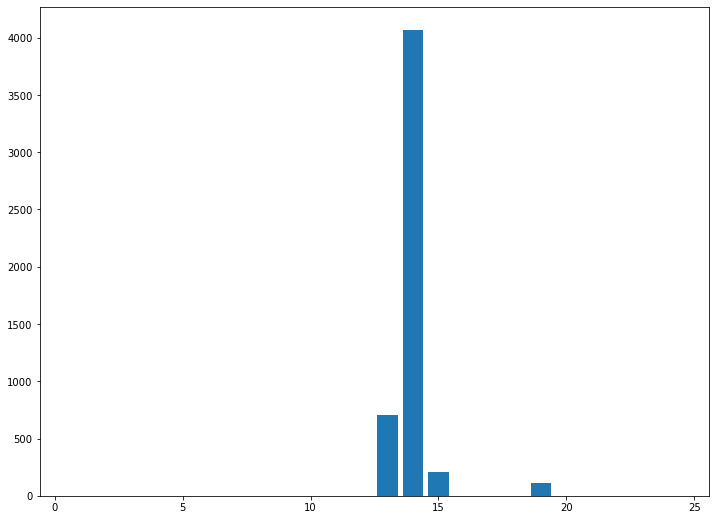

In [42]:
plt.figure(figsize = (12,9))
plt.bar(dfarray[:,0], dfarray[:,1])

<a id="word-cloud"></a>
### Word Cloud

preparation

In [43]:
jieba.initialize()

jieba.set_dictionary('dict/dict.big.txt')

Building prefix dict from the default dictionary ...
Loading model from cache C:\Users\princ\AppData\Local\Temp\jieba.cache
Loading model cost 0.791 seconds.
Prefix dict has been built succesfully.


In [44]:
# 將標題 與 內文 合併一起做文字雲
raw_text = list(board_df["title"] + board_df["content"])

In [45]:
# 設定停用詞 (把不要的詞彙放在這兒)
with open('dict/stopwords.txt', 'r', encoding='utf8') as f:
    stops = f.read().split('\n')

In [46]:
raw_text_dic = {}
for line in raw_text:
    line = line.strip('\n')
    words = jieba.cut(line, cut_all=False)
    for word in words:
        if word not in stops:
            if len(word) > 1:
                word = str(word).strip().replace("\n", "").replace("\r", "").replace(" ", "")
                if word not in raw_text_dic:
                    raw_text_dic[word] = 1
                else:
                    raw_text_dic[word] += 1

Building prefix dict from D:\Programming\Python\Neo4j\課程\dict\dict.big.txt ...
Dumping model to file cache C:\Users\princ\AppData\Local\Temp\jieba.u2119b7327cb8dafa65534ff0e37256b6.cache
Loading model cost 1.659 seconds.
Prefix dict has been built succesfully.


get wordcloud

In [47]:
alice_mask = np.array(Image.open("images/cloud_mask7.png"))
wc = WordCloud(background_color="white", max_words=2000, mask=alice_mask, font_path="font/msjh.ttc", width=2400, height=2400)
wc.generate_from_frequencies(raw_text_dic)

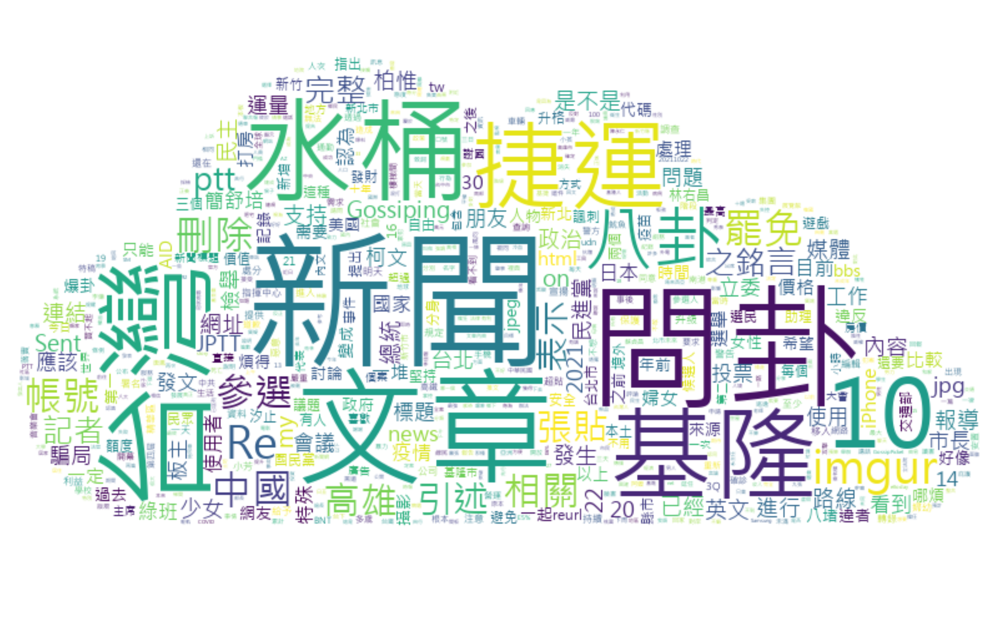

In [48]:
# show word cloud
plt.rcParams["figure.figsize"] = (200,100)
plt.imshow(wc, interpolation='bilinear')
plt.axis("off")
plt.show()

In [49]:
# save word cloud image to file
picture_name = "images/wordcloud.png"
wc.to_file(picture_name)

<a id="ptt-sentimental-data-set"></a>
### Read PTT Sentimental data set

In [50]:
import pandas as pd
from pandas import ExcelWriter
from pandas import ExcelFile

df = pd.read_excel('opt/PTT_crawler_page_data.xlsx')
df = df[['comment_content','comment_status']]
df.head()

,comment_content,comment_status
0,不夠嚴謹,→
1,摸不到 c 罩杯,推
2,不然你要用cmd.exe嗎,→
3,XDDDDDD 可能想學bash吧,推
4,"Write-Host, Write-Output, 直接打變數, Echo, Write",→


In [51]:
def convert_ptt_flag(status):
    res_flag = 0
    if '推' in status:
        res_flag = 1
    elif '噓' in status:
        res_flag = 2
    return res_flag
if 'comment_status' in df.columns:
    df["comment_status"] = df["comment_status"].apply(lambda x: convert_ptt_flag(x))
    df.rename(columns = {'comment_status':'rating'}, inplace = True)
df = df[df.rating != 0]
df.head()

,comment_content,rating
1,摸不到 c 罩杯,1
3,XDDDDDD 可能想學bash吧,1
7,第二個情況python之類的也會啊,1
10,我也不知道 為什麼有cmd 也有 powershell,1
13,script language就是方便用而已啊 搬搬檔案 日常佈署會用,1


In [52]:
df = df.drop_duplicates(subset='comment_content', keep="last")
df.head()

,comment_content,rating
1,摸不到 c 罩杯,1
3,XDDDDDD 可能想學bash吧,1
7,第二個情況python之類的也會啊,1
10,我也不知道 為什麼有cmd 也有 powershell,1
13,script language就是方便用而已啊 搬搬檔案 日常佈署會用,1


### Homework
Agents, here is the mission for you

Project: You are a researcher works at social analysis company, please find out a specific industrial insights from netizen on ptt.cc.

1. Select a board from ptt.cc (such as Gossiping or NBA etc.) which you’re interested in.

2. Using David’s ptt crawler as template. 

3. Look for insights depends on your observation, and share your findings and send a brief report to David.

4. Share your report on our Facebook group.